Saving week2.mp3 to week2.mp3
Playing Original Audio:


Playing Noisy Audio:


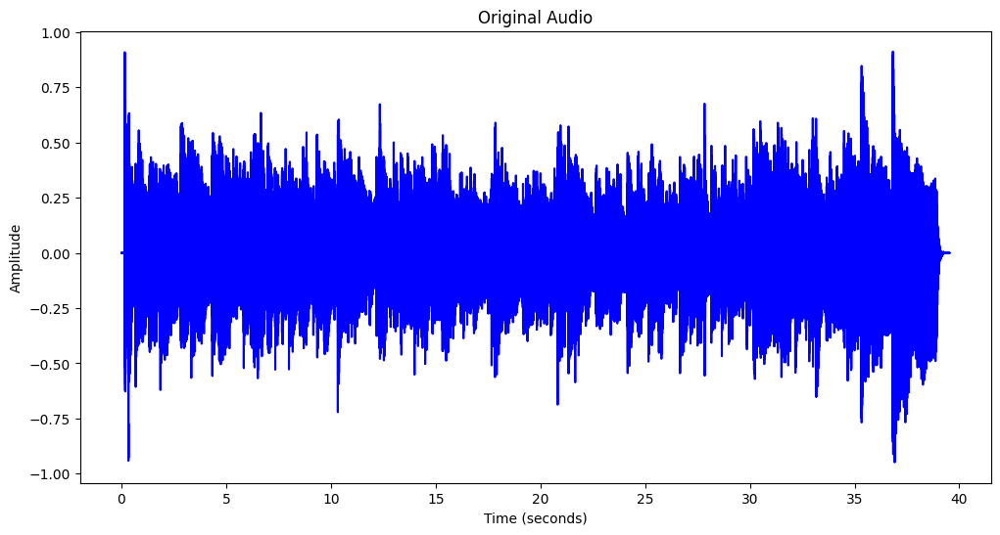

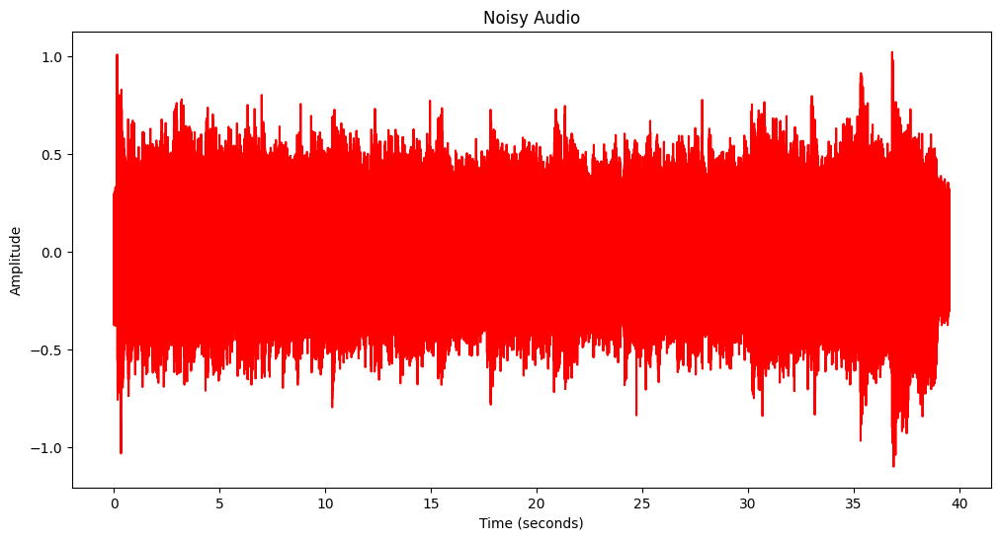

In [ ]:
#Load an audio sample, and add gaussian noise. Call this noisy_audio
#Have an option to play both the original audio and noise_audio, and plot their time series

import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import Audio

from google.colab import files
uploaded = files.upload()

filename = next(iter(uploaded))#stores the first file from the uploaded list of file names

# Load the audio file
original_audio , sr = librosa.load(filename, sr=None)

# Gaussian noise
mean = 0
variance = 0.01
gaussian_noise = np.random.normal(mean, np.sqrt(variance), original_audio.shape)

# noisy_audio
noisy_audio = original_audio + gaussian_noise

# Play the original audio
print("Playing Original Audio:")
original_audio_display = Audio(original_audio, rate=sr)
display(original_audio_display)

# Play the noisy audio
print("Playing Noisy Audio:")
noisy_audio_display = Audio(noisy_audio, rate=sr)
display(noisy_audio_display)

# time axes
time_original = np.linspace(0, len(original_audio) / sr, num=len(original_audio))
time_noisy = np.linspace(0, len(noisy_audio) / sr, num=len(noisy_audio))

# Plot Original Audio
plt.figure(figsize=(12,6))
plt.plot(time_original, original_audio, color='blue')
plt.title('Original Audio')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')
plt.show()

# Plot Noisy Audio
plt.figure(figsize=(12,6))
plt.plot(time_noisy, noisy_audio, color='red')
plt.title('Noisy Audio')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')
plt.show()

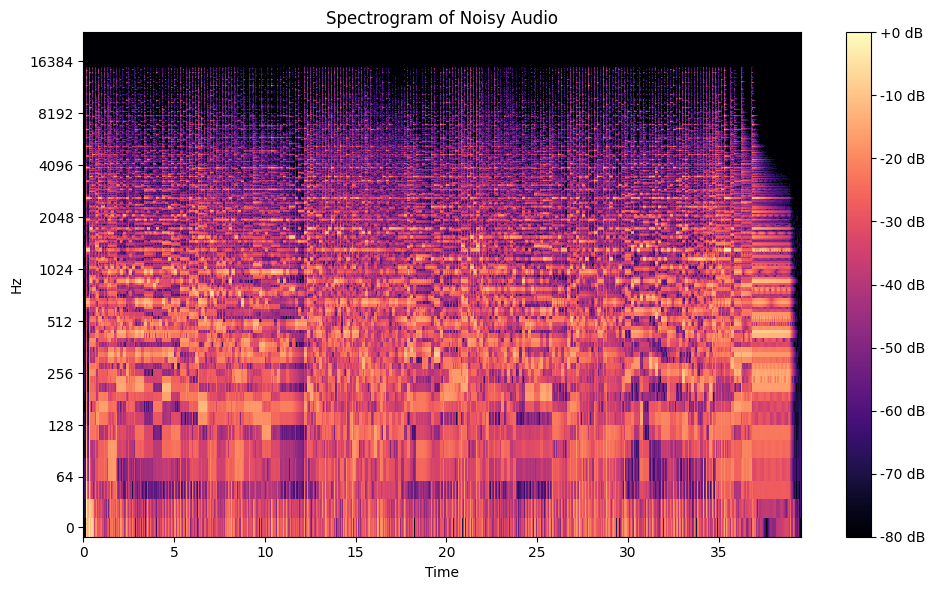

In [ ]:
#Plot the spectrogram of the noisy_audio
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
!pip install noisereduce
import noisereduce as nr
import soundfile as sf

# Load the MP3 file
noisy_audio_path = "week2.mp3"  # Update with your file name
noisy_audio, sr = librosa.load(noisy_audio_path, sr=None)

# Plot the spectrogram of the noisy audio
plt.figure(figsize=(10, 6))
D_noisy = librosa.amplitude_to_db(np.abs(librosa.stft(noisy_audio)), ref=np.max)
librosa.display.specshow(D_noisy, sr=sr, x_axis='time', y_axis='log', cmap='magma')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of Noisy Audio')
plt.tight_layout()
plt.show()




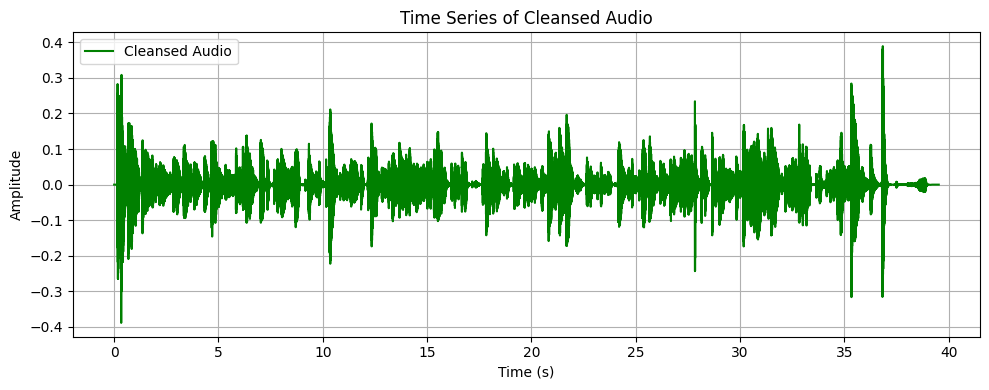

Cleaned audio saved as cleansed_audio.wav


In [ ]:
#Clean the audio using “noisereduce” library and name the resultant file, “cleansed audio”, and plot its time series
# Reduce noise using noisereduce
reduced_noise_audio = nr.reduce_noise(y=noisy_audio, sr=sr, prop_decrease=1.0)

# Save the cleaned audio as a WAV file
cleaned_audio_path = "cleansed_audio.wav"
sf.write(cleaned_audio_path, reduced_noise_audio, sr)#sf.write() is a function from the soundfile library
# used to write reduced noise audio to a file names cleansed_audio.wav with sr content as well

# Plot the time series of the cleaned audio
plt.figure(figsize=(10, 4))
plt.plot(np.linspace(0, len(reduced_noise_audio) / sr, len(reduced_noise_audio)), reduced_noise_audio, label="Cleansed Audio", color='green')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Time Series of Cleansed Audio')
plt.grid(True)
plt.tight_layout()
plt.legend()
plt.show()

print(f"Cleaned audio saved as {cleaned_audio_path}")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

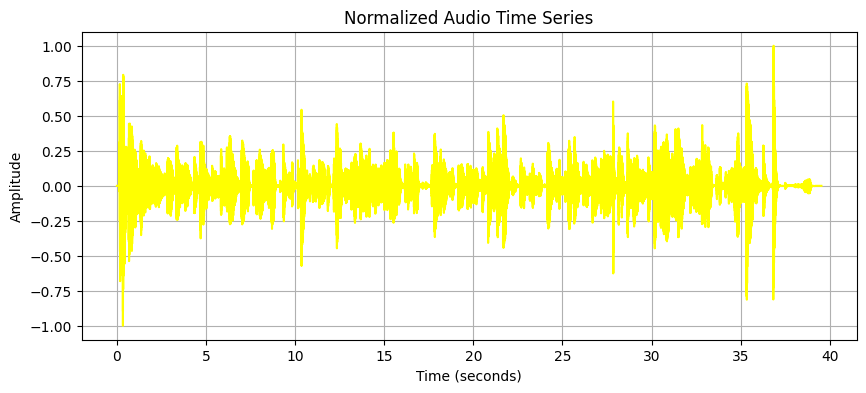

In [ ]:
#Normalize the cleansed_audio and name it normalised_audio and display its time series
# (scale the values between -1 and 1)
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
!pip install noisereduce
import noisereduce as nr
import soundfile as sf
reduced_noise_audio = nr.reduce_noise(y=noisy_audio, sr=sr, prop_decrease=1.0)
normalised_audio = reduced_noise_audio / np.max(np.abs(reduced_noise_audio))



# Save the normalized audio (optional)
sf.write("normalised_audio.wav", normalised_audio, sr)
from google.colab import files
files.download('normalised_audio.wav')  # to load the normalised audio wave to local computer

# Display the time series of the normalized audio
plt.figure(figsize=(10, 4))
plt.plot(np.linspace(0, len(normalised_audio) / sr, num=len(normalised_audio)), normalised_audio,color='yellow')
plt.title("Normalized Audio Time Series")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()


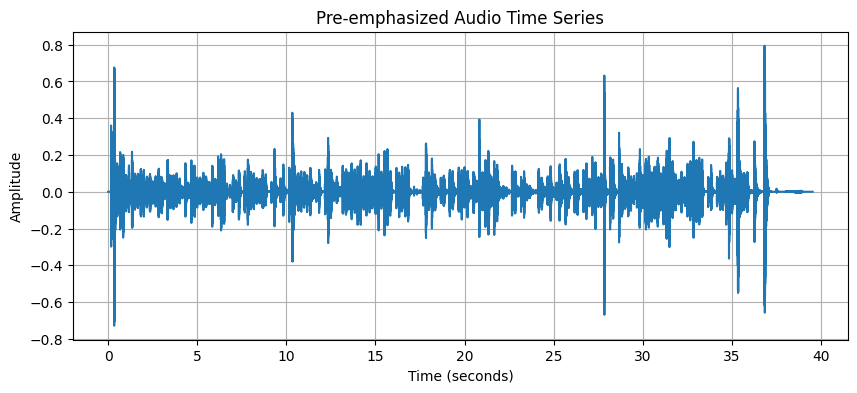

Frame length: 1200 samples
Frame shift: 480 samples
Length of pre-emphasized audio: 1897344 samples


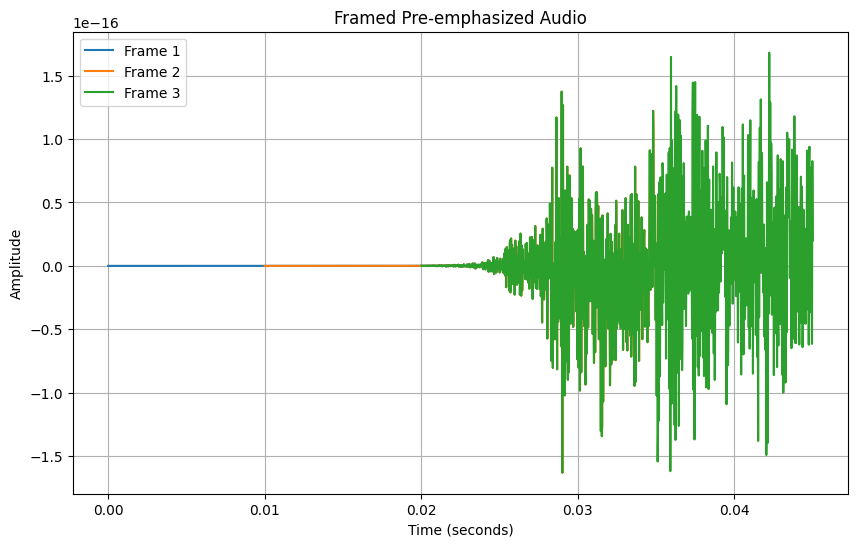

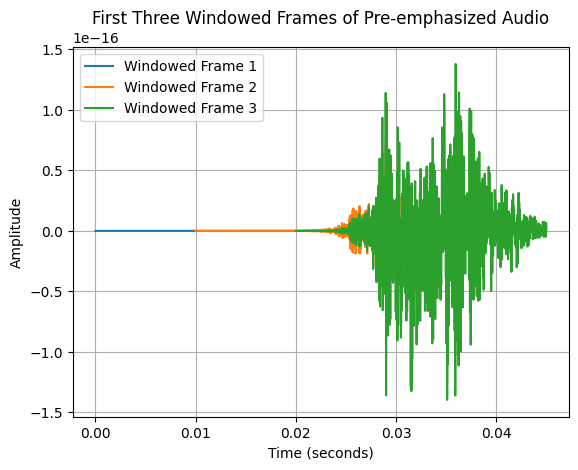

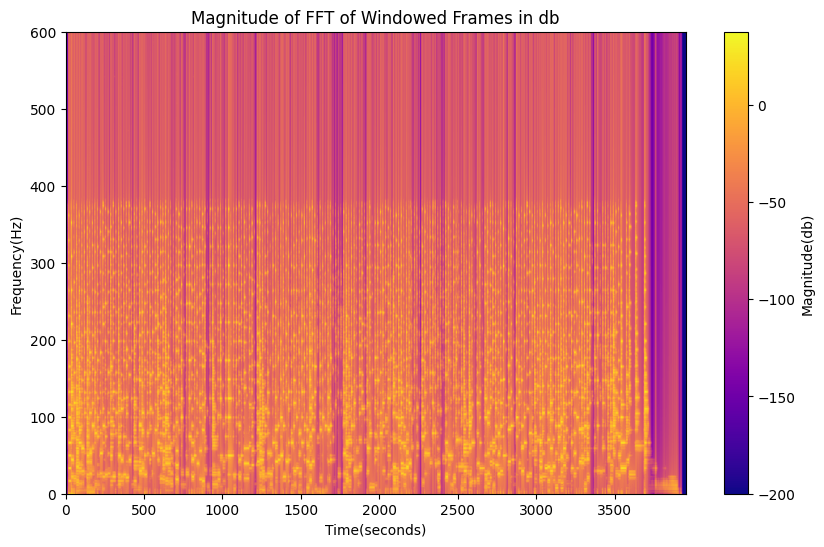

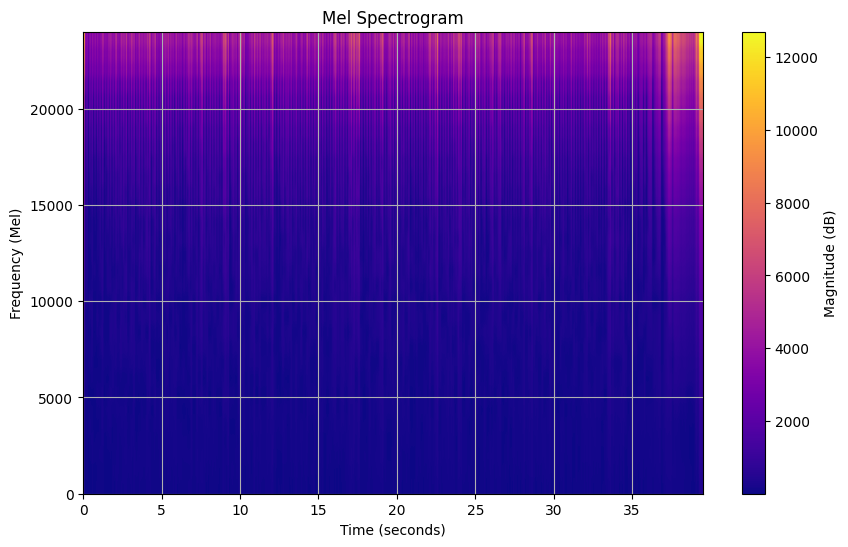

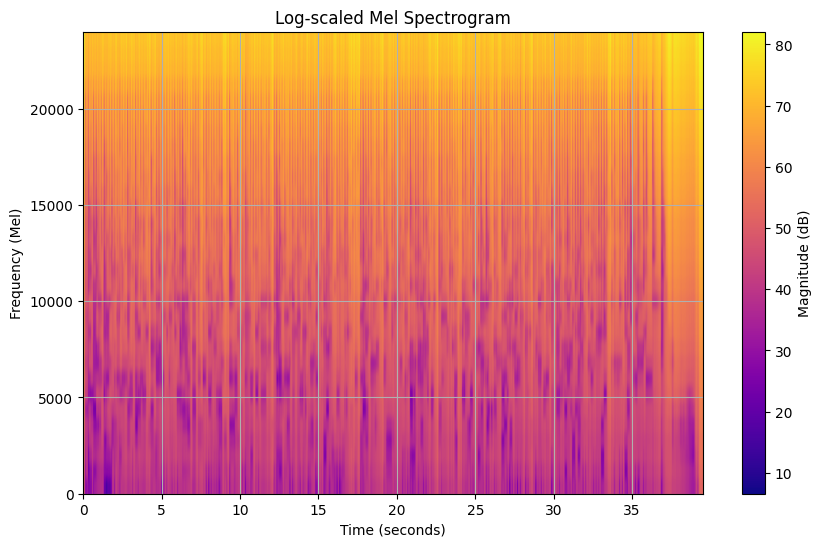

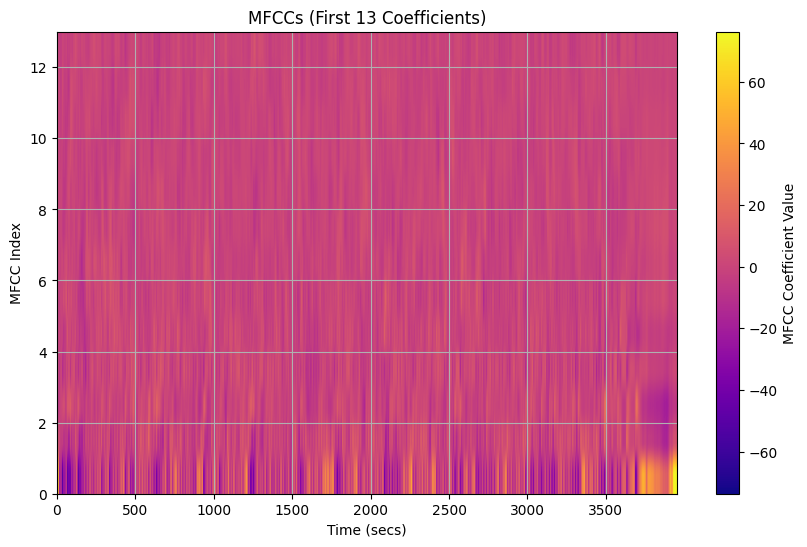

In [ ]:
#Extract its MFCCs, with the steps mentioned in the doc link above, and plot results for each intermediate steps


#1Pre - emphasis of audio signal:
import numpy as np
import matplotlib.pyplot as plt
import soundfile as sf

# Pre-emphasis parameter (alpha between 0.9 and 1.0)
alpha = 0.9

# Apply pre-emphasis filter
normalised_audio = reduced_noise_audio / np.max(np.abs(reduced_noise_audio))

pre_emphasized_audio = np.append(normalised_audio[0], normalised_audio[1:] - alpha * normalised_audio[:-1])
# The first sample is left unchanged because there's no previous sample.
# For all subsequent samples, the difference between the current sample and the previous one is scaled by alpha,appends joins 2 arrays(1st element and subsequent)
# α (usually between 0.9 and 1.0), emphasizing the high frequencies.
# The result is a signal where higher frequencies are enhanced


# Save the pre-emphasized audio (optional)
sf.write("pre_emphasized_audio.wav", pre_emphasized_audio, sr)

# Display the time series of the pre-emphasized audio
plt.figure(figsize=(10, 4))
plt.plot(np.linspace(0, len(pre_emphasized_audio) / sr, num=len(pre_emphasized_audio)), pre_emphasized_audio)
plt.title("Pre-emphasized Audio Time Series")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()

#2Framing:
# Parameters for framing
frame_length_ms = 25  # Length of each frame in milliseconds-window length
frame_shift_ms = 10   # Shift between frames in milliseconds-hop size

# Convert frame length and shift from milliseconds to samples
frame_length = int(sr * frame_length_ms / 1000)  # frame length in samples
frame_shift = int(sr * frame_shift_ms / 1000)    # frame shift in samples
print(f"Frame length: {frame_length} samples")
print(f"Frame shift: {frame_shift} samples")



# Number of frames in the audio signal
num_frames = int(np.ceil(len(pre_emphasized_audio) / frame_shift))
# len(pre_emphasized_audio): The total number of samples in the pre-emphasized audio signal.
# frame_shift: The number of samples between the start of one frame and the next.
# calculates how many# frames are needed to cover the entire audio signal. It uses np.ceil() to round up, ensuring that the last frame is accounted for even if the audio doesnt divide perfectly into the frame size.
# For instance, if you have a signal with 1600 samples and a frame shift of 400 samples, you will need 4 frames (since 1600/400=4)

# Calculate padding length
pad_length = (num_frames * frame_shift + frame_length) - len(pre_emphasized_audio)
# Make sure pad_length is positive
pad_length = max(0, pad_length)
# Only pad if necessary
if pad_length > 0:
    padded_audio = np.pad(pre_emphasized_audio, (0, pad_length), mode='constant')
else:
    padded_audio = pre_emphasized_audio  # No padding if no need

# Pad the audio signal with zeros at the end
padded_audio = np.pad(pre_emphasized_audio, (0, pad_length), mode='constant')
#Frame the audio signal
frames = []
for i in range(num_frames):
    start = i * frame_shift
    end = start + frame_length
    frame = padded_audio[start:end]
    frames.append(frame)

# Convert frames to a NumPy array for easier manipulation
frames = np.array(frames)
print(f"Length of pre-emphasized audio: {len(pre_emphasized_audio)} samples")


# Optional: Apply windowing (e.g., Hamming window) to each frame
# window = np.hamming(frame_length)
# frames_windowed = frames * window

# Plot a few frames to visualize the framing process
plt.figure(figsize=(10, 6))

# Plot first 3 frames to visualize the framing
for i in range(min(3, num_frames)):
    plt.plot(np.linspace(i * frame_shift / sr, (i * frame_shift + frame_length) / sr, frame_length), frames[i], label=f'Frame {i + 1}')

plt.title("Framed Pre-emphasized Audio")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)
plt.show()



#3windowing(hamming window)
window = np.hamming(frame_length)#This creates a Hamming window of length equal to the frame length.
frames_windowed = frames * window

# Loop through the first 3 windowed frames (or fewer if there aren't enough frames)
for i in range(min(3, len(frames_windowed))):
    # Calculate the time axis for the frame
    start_time = i * frame_shift / sr  # Starting time of the frame in seconds
    end_time = (i * frame_shift + frame_length) / sr  # Ending time of the frame in seconds

    # Create a time vector for the frame
    time_vector = np.linspace(start_time, end_time, frame_length)

    # Plot the current windowed frame
    plt.plot(time_vector, frames_windowed[i], label=f'Windowed Frame {i + 1}')

# Add title, labels, and legend
plt.title("First Three Windowed Frames of Pre-emphasized Audio")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)

# Show the plot
plt.show()

#4 FFT of each windowed frames individually and then stacking them together
# Initialize a list to store the FFT results
fft_results = []

# Loop through the windowed frames to compute the FFT of each frame
for i in range(len(frames_windowed)):  # Loop over first 3 frames (or less)
    # Calculate the FFT of the windowed frame
    fft_frame = np.fft.fft(frames_windowed[i])

    half_point = frame_length // 2
    fft_magnitude = np.abs(fft_frame)[:half_point]
    fft_results.append(20 * np.log10(fft_magnitude + 1e-10))  # Log scale (dB), small epsilon to avoid log(0)
  # Storing the magnitude of the FFT in db

# Convert the list of FFT results into a numpy array
fft_results = np.array(fft_results)

# Stack them together (fft_results is already stacked row-wise)
# Now fft_results is a 2D array where each row is the FFT of a windowed frame

# Plot the magnitude of the FFT results
plt.figure(figsize=(10, 6))
plt.imshow(fft_results.T, aspect='auto', cmap='plasma', origin='lower', extent=[0, len(fft_results), 0, frame_length//2])
plt.colorbar(label='Magnitude(db)')
plt.xlabel('Time(seconds)')
plt.ylabel('Frequency(Hz)')
plt.title('Magnitude of FFT of Windowed Frames in db')
# plt.grid(True)
plt.show()

#5Mel scaled filterbanks:
frequencies = np.fft.fftfreq(frame_length, d=1/sr)  # Frequency bins in Hz
frequencies = np.abs(frequencies[:frame_length // 2])  # Positive frequencies
mel_frequencies = 1127 * np.log(1 + frequencies / 700)
#  Create a Mel filter bank
# Max Mel frequency corresponds to Nyquist frequency
mel_max = 1127 * np.log(1 + (sr / 2) / 700)

n_mels = 30 # Number of Mel bins (filters)
mel_points = np.linspace(0, mel_max, n_mels + 2)
hz_points = 700 * (np.exp(mel_points / 1127) - 1)

# Create the Mel filter bank
mel_filter_bank = np.zeros((n_mels, frame_length // 2))

# Construct the triangular Mel filters
for i in range(1, n_mels + 1):
    left = int(np.floor(hz_points[i - 1] * frame_length / sr))
    center = int(np.floor(hz_points[i] * frame_length / sr))
    right = int(np.floor(hz_points[i + 1] * frame_length / sr))

    # Apply triangular filter
    mel_filter_bank[i - 1, left:center] = np.linspace(0, 1, center - left)
    mel_filter_bank[i - 1, center:right] = np.linspace(1, 0, right - center)
#Apply Mel Filter Bank:
mel_spectrogram = np.dot(np.abs(fft_results), mel_filter_bank.T)
#plot
plt.figure(figsize=(10, 6))
plt.imshow(mel_spectrogram.T, aspect='auto', cmap='plasma', origin='lower', extent=[0, num_frames * frame_shift / sr, 0, sr / 2])
plt.colorbar(label='Magnitude (dB)')
plt.xlabel('Time (seconds)')
plt.ylabel('Frequency (Mel)')
plt.title('Mel Spectrogram')
plt.grid(True)
plt.show()

#6applying logarithmic compression in db
mel_spectrogram_db = 20 * np.log10(mel_spectrogram + 1e-10)  # Add small epsilon to avoid log(0)

#  Plot the Log-scaled Mel spectrogram
plt.figure(figsize=(10, 6))
plt.imshow(mel_spectrogram_db.T, aspect='auto', cmap='plasma', origin='lower', extent=[0, num_frames * frame_shift / sr, 0, sr / 2])
plt.colorbar(label='Magnitude (dB)')
plt.xlabel('Time (seconds)')
plt.ylabel('Frequency (Mel)')
plt.title('Log-scaled Mel Spectrogram')
plt.grid(True)
plt.show()


#7Discrete Cosine Transform (DCT):
# Number of MFCCs to keep (usually the first 12 or 13 coefficients are used)
num_mfcc = 13

# 1. Apply Discrete Cosine Transform (DCT) to the log-Mel spectrogram
from scipy.fftpack import dct
mfcc = dct(mel_spectrogram_db, type=2, axis=1, norm='ortho')

# 2. Keep only the first `num_mfcc` coefficients
mfcc = mfcc[:, :num_mfcc]

# Optional: Mean normalization (centering the MFCCs by subtracting the mean)
# This is often done for better results in speech processing tasks.
mfcc = mfcc - np.mean(mfcc, axis=0)

#  Plot the MFCCs
plt.figure(figsize=(10, 6))
plt.imshow(mfcc.T, aspect='auto', cmap='plasma', origin='lower', extent=[0, mel_spectrogram_db.shape[0], 0, num_mfcc])
plt.colorbar(label='MFCC Coefficient Value')
plt.xlabel('Time (secs)')
plt.ylabel('MFCC Index')
plt.title('MFCCs (First 13 Coefficients)')
plt.grid(True)
plt.show()







Please upload your audio file:


Saving normalised_audio.wav to normalised_audio.wav
Uploaded file: normalised_audio.wav


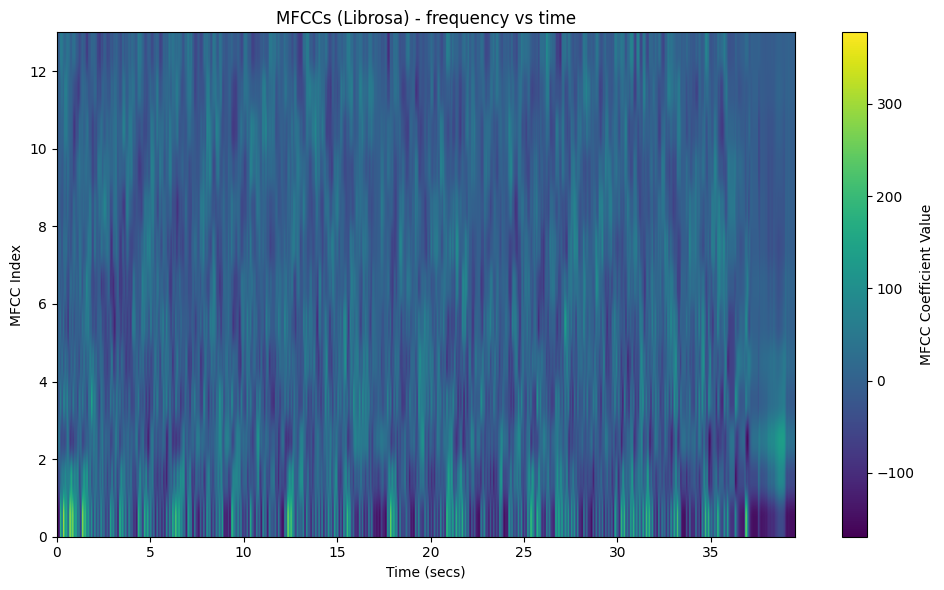


Comments on the Results:
1. The plot displays the 13 MFCC coefficients (y-axis) over time (x-axis).
2. Color intensity indicates the magnitude of the MFCC coefficients, representing the spectral envelope characteristics of the audio signal.
3. Lower MFCC indices (e.g., 0–2) capture general spectral trends such as pitch, while higher indices (e.g., 3–12) represent finer details like timbre.
4. Temporal variations in the coefficients correspond to changes in the audio signal, such as pitch shifts or tonal variations.
5. This MFCC representation is commonly used in audio tasks like speech recognition and music analysis.



In [ ]:
#Also plot MFCC directly using librosa, and comment on the results
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt
from google.colab import files

# Step 1: Upload the audio file
print("Please upload your audio file:")
uploaded = files.upload()

# Extract the file name
audio_path = list(uploaded.keys())[0]  # Get the uploaded file name
print(f"Uploaded file: {audio_path}")

# Step 2: Load the audio file
normalised_audio, sr = librosa.load(audio_path, sr=None)

# Step 3: Compute MFCCs using librosa
n_mfcc = 13
hop_length = int(sr * 0.01)  # 10ms hop size
n_fft = int(sr * 0.025)      # 25ms frame length

# Compute MFCCs
mfcc_librosa = librosa.feature.mfcc(y=normalised_audio, sr=sr, n_mfcc=n_mfcc, hop_length=hop_length, n_fft=n_fft)

# Normalize the MFCCs (optional)
mfcc_librosa = mfcc_librosa - np.mean(mfcc_librosa, axis=1, keepdims=True)

# Get time scale for x-axis
time_scale = np.linspace(0, len(normalised_audio) / sr, mfcc_librosa.shape[1])

# Adjusting the librosa plot to match manual extraction format
plt.figure(figsize=(10, 6))
extent = [0, len(normalised_audio) / sr, 0, n_mfcc]  # Manually setting extent to match manual plot
plt.imshow(mfcc_librosa, aspect='auto', cmap='viridis', origin='lower', extent=extent)

# Adding color bar, labels
plt.colorbar(label='MFCC Coefficient Value')
plt.xlabel('Time (secs)')
plt.ylabel('MFCC Index')
plt.title('MFCCs (Librosa) - frequency vs time')
plt.tight_layout()
plt.show()

# Comment on the results
print("""
Comments on the Results:
1. The plot displays the 13 MFCC coefficients (y-axis) over time (x-axis).
2. Color intensity indicates the magnitude of the MFCC coefficients, representing the spectral envelope characteristics of the audio signal.
3. Lower MFCC indices (e.g., 0–2) capture general spectral trends such as pitch, while higher indices (e.g., 3–12) represent finer details like timbre.
4. Temporal variations in the coefficients correspond to changes in the audio signal, such as pitch shifts or tonal variations.
5. This MFCC representation is commonly used in audio tasks like speech recognition and music analysis.
""")